In [1]:
# pip install plotly.express 


In [2]:
import pandas as pd
import numpy as np
from sklearn.exceptions import UndefinedMetricWarning
from  sklearn.naive_bayes import GaussianNB

from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC


from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.feature_selection import RFECV
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.graph_objs as go


from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import accuracy_score, f1_score
from sklearn.feature_selection import RFE

from yellowbrick.text import TSNEVisualizer
from sklearn.manifold import TSNE
from sklearn.utils.multiclass import unique_labels
from sklearn.feature_selection import SelectKBest, f_classif, VarianceThreshold, mutual_info_classif


from sklearn.decomposition import PCA

from sklearn.preprocessing import MinMaxScaler, StandardScaler

from sklearn.inspection import permutation_importance

import warnings
warnings.filterwarnings("ignore", category=UndefinedMetricWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
def conf_matrix(x, y, title, show_report=False):
    cm = confusion_matrix(x, y)
    plt.figure(figsize=(6, 4))
    
    sns.heatmap(cm, annot=True, fmt='d', cmap="Oranges", cbar=False)
    plt.title(f'Confusion Matrix - {title} Data')
    plt.xlabel('Predicted Class')
    plt.ylabel('True Class')
    plt.show()
    if not show_report:
        print("Accuracy: ", accuracy_score(x, y))

    if show_report:
        report = classification_report(x, y)
        print("Classification Report:")
        print(report)
        plt.show()
    return accuracy_score(x, y)

In [4]:
def calculate_Accuracy(x, y):
     return accuracy_score(x, y)

In [5]:
Forest_Train=pd.read_csv("https://raw.githubusercontent.com/ahmedbadawy11/Forest-Cover-Type-Prediction/main/training_dataset.csv")
Forest_Test=pd.read_csv("https://raw.githubusercontent.com/ahmedbadawy11/Forest-Cover-Type-Prediction/main/test_dataset.csv")
Forest_validation=pd.read_csv("https://raw.githubusercontent.com/ahmedbadawy11/Forest-Cover-Type-Prediction/main/validation_dataset.csv")

In [6]:
Forest_Train.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,8192,2976,85,23,95,72,2436,246,193,64,...,0,0,0,0,0,0,0,0,0,1
1,14089,3104,233,12,150,40,1503,200,251,186,...,0,0,0,0,0,0,0,0,0,1
2,10246,3385,160,7,937,204,1224,228,242,147,...,0,0,0,0,0,0,0,0,0,1
3,8686,3191,41,14,210,37,3207,221,208,119,...,1,0,0,0,0,0,0,0,0,1
4,9242,2821,297,4,85,1,992,208,238,169,...,0,0,0,0,0,0,0,0,0,1


In [7]:
Forest_Train.shape

(8286, 56)

In [8]:
Forest_Train["Id"].value_counts()

8192     1
11755    1
13396    1
10882    1
6318     1
        ..
3371     1
4590     1
4397     1
4435     1
2017     1
Name: Id, Length: 8286, dtype: int64

In [9]:
Forest_Train.describe()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.00000,...,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000
mean,7609.998431,2732.983104,155.366643,16.868694,225.249698,53.233888,1629.840574,213.732682,218.534999,133.00712,...,0.035723,0.031620,0.001328,0.008810,0.000845,0.003259,0.063481,0.056119,0.040068,4.561550
std,4291.741503,432.906958,108.392758,8.514811,213.670866,62.890107,1259.714393,30.675904,23.142959,46.73019,...,0.185610,0.174996,0.036413,0.093453,0.029055,0.056994,0.243840,0.230165,0.196130,1.789533
min,1.000000,1863.000000,0.000000,0.000000,0.000000,-134.000000,0.000000,58.000000,99.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,3889.500000,2350.000000,66.000000,10.000000,60.000000,5.000000,726.000000,197.000000,206.000000,103.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
50%,7479.500000,2720.500000,125.000000,16.000000,175.000000,34.000000,1273.000000,221.000000,222.000000,136.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000
75%,11349.750000,3099.750000,252.000000,23.000000,323.000000,84.000000,2155.000000,237.000000,235.000000,166.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000
max,15120.000000,3849.000000,360.000000,50.000000,1343.000000,547.000000,6508.000000,254.000000,254.000000,248.00000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


In [10]:
Forest_Train.std()

Id                                    4291.741503
Elevation                              432.906958
Aspect                                 108.392758
Slope                                    8.514811
Horizontal_Distance_To_Hydrology       213.670866
Vertical_Distance_To_Hydrology          62.890107
Horizontal_Distance_To_Roadways       1259.714393
Hillshade_9am                           30.675904
Hillshade_Noon                          23.142959
Hillshade_3pm                           46.730190
Horizontal_Distance_To_Fire_Points    1053.310891
Wilderness_Area1                         0.404813
Wilderness_Area2                         0.172060
Wilderness_Area3                         0.494934
Wilderness_Area4                         0.471731
Soil_Type1                               0.156079
Soil_Type2                               0.208670
Soil_Type3                               0.254955
Soil_Type4                               0.242103
Soil_Type5                               0.107018


In [11]:
Forest_Train.isnull().sum()

Id                                    0
Elevation                             0
Aspect                                0
Slope                                 0
Horizontal_Distance_To_Hydrology      0
Vertical_Distance_To_Hydrology        0
Horizontal_Distance_To_Roadways       0
Hillshade_9am                         0
Hillshade_Noon                        0
Hillshade_3pm                         0
Horizontal_Distance_To_Fire_Points    0
Wilderness_Area1                      0
Wilderness_Area2                      0
Wilderness_Area3                      0
Wilderness_Area4                      0
Soil_Type1                            0
Soil_Type2                            0
Soil_Type3                            0
Soil_Type4                            0
Soil_Type5                            0
Soil_Type6                            0
Soil_Type7                            0
Soil_Type8                            0
Soil_Type9                            0
Soil_Type10                           0


In [12]:
Forest_Train.duplicated().sum()

0

In [13]:
Forest_Train.dtypes

Id                                    int64
Elevation                             int64
Aspect                                int64
Slope                                 int64
Horizontal_Distance_To_Hydrology      int64
Vertical_Distance_To_Hydrology        int64
Horizontal_Distance_To_Roadways       int64
Hillshade_9am                         int64
Hillshade_Noon                        int64
Hillshade_3pm                         int64
Horizontal_Distance_To_Fire_Points    int64
Wilderness_Area1                      int64
Wilderness_Area2                      int64
Wilderness_Area3                      int64
Wilderness_Area4                      int64
Soil_Type1                            int64
Soil_Type2                            int64
Soil_Type3                            int64
Soil_Type4                            int64
Soil_Type5                            int64
Soil_Type6                            int64
Soil_Type7                            int64
Soil_Type8                      

In [14]:
Forest_Train["Cover_Type"].value_counts()

7    1720
5    1569
3    1385
4    1368
6    1036
2     861
1     347
Name: Cover_Type, dtype: int64

In [15]:
Forest_Train["Hillshade_3pm"]

0        64
1       186
2       147
3       119
4       169
       ... 
8281    175
8282    146
8283     88
8284    143
8285    157
Name: Hillshade_3pm, Length: 8286, dtype: int64

In [16]:
def Plot_pie(Forest_data,title=None):
    Cover_Type_count=Forest_data.groupby('Cover_Type').size().reset_index()
    # Grouped data and using sum method to have count of Mortality national comparison.
    Cover_Type_count=Cover_Type_count.rename(columns = {0:'count'})
#     Cover_Type_count
    Cover_Type_count_fig=px.pie(Cover_Type_count,names='Cover_Type',values='count',title=f'Unique values of Cover Type - {title}'
                   ,color_discrete_sequence=px.colors.sequential.RdBu ,hole=0.2)
    #apply specific colors using 'color_discrete_map' to have a sequence of colors
    #and make the hole of pie using hole method.
    Cover_Type_count_fig.show()
    return Cover_Type_count

In [17]:
Plot_pie(Forest_Train,"Training Set")

,Cover_Type,count
0,1,347
1,2,861
2,3,1385
3,4,1368
4,5,1569
5,6,1036
6,7,1720


In [18]:
# Plot_pie(Forest_Test,"Test Set")

In [19]:
# Plot_pie(Forest_validation,"validation Set")

In [20]:
def Plot_Box(Forest_data):
    color_scale={'A':'rgb(255,0,127)','B':'rgb(255,153,204)','C':'rgb(51,0,25)'}

    selected_columns = Forest_data[['Elevation', 'Aspect', 'Slope','Horizontal_Distance_To_Hydrology',
                                     'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways','Hillshade_9am', 
                                     'Hillshade_Noon', 'Hillshade_3pm','Horizontal_Distance_To_Fire_Points']]
    for i, col in enumerate(selected_columns.columns):
        fig = px.box(Forest_data,  y=col,color_discrete_map=color_scale,   notched=True)
        fig.show()

In [21]:
 Plot_Box(Forest_Train)

In [22]:
#  Plot_Box(Forest_Test)

In [23]:
#  Plot_Box(Forest_validation)

In [24]:
def Plot_distribution(Forest_data):
    selected_columns = Forest_data[['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
                                 'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
                                 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
                                 'Horizontal_Distance_To_Fire_Points']]

    sns.set(style='whitegrid')

    num_cols = 3
    num_rows = (len(selected_columns.columns) + num_cols - 1) // num_cols


    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))


    axes = axes.flatten()


    for i, col in enumerate(selected_columns.columns):
        sns.distplot(selected_columns[col], ax=axes[i])
        axes[i].set_xlabel(col, fontsize=12)
        axes[i].set_ylabel('Density', fontsize=12)
        axes[i].set_title(f'Distribution of {col}', fontsize=14)


    for j in range(len(selected_columns.columns), len(axes)):
        axes[j].axis('off')

    plt.tight_layout()


    plt.show()


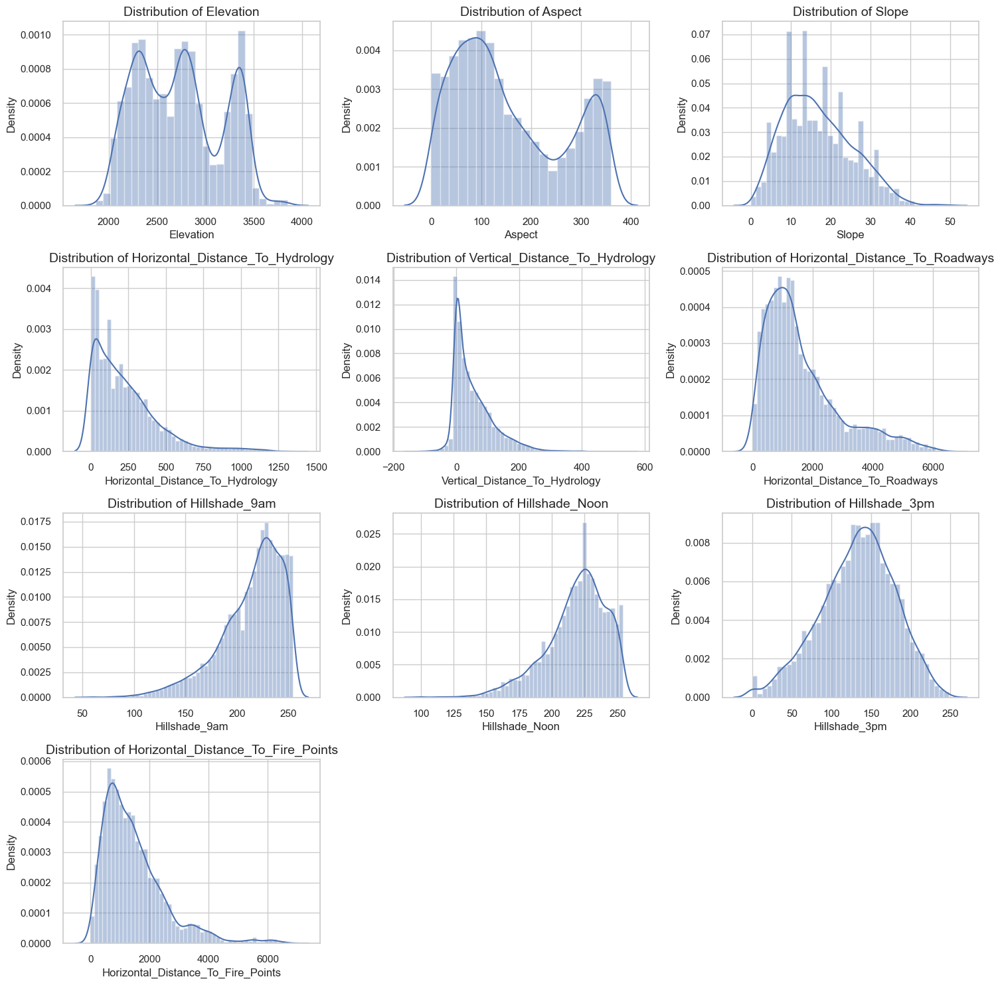

In [25]:
Plot_distribution(Forest_Train)

In [26]:
# Plot_distribution(Forest_Test)

In [27]:
# Plot_distribution(Forest_validation)

In [28]:
def plot_pairplot(Forest_data):
    sns.set(style='ticks', font_scale=1.2)

    pair_plot = sns.pairplot(data=Forest_data,
                            hue='Cover_Type',
                            vars=['Aspect', 'Slope', 'Hillshade_9am', 'Horizontal_Distance_To_Roadways',
                                  'Horizontal_Distance_To_Hydrology', 'Horizontal_Distance_To_Fire_Points'],

    #                          kind='reg'
                            diag_kind="kde"
                            )

    # pair_plot.map_upper(sns.kdeplot)
    pair_plot.fig.suptitle("Pair Plot of Selected Features by Cover Type", y=1.02, fontsize=16)
    plt.subplots_adjust(top=0.9)

    plt.show()

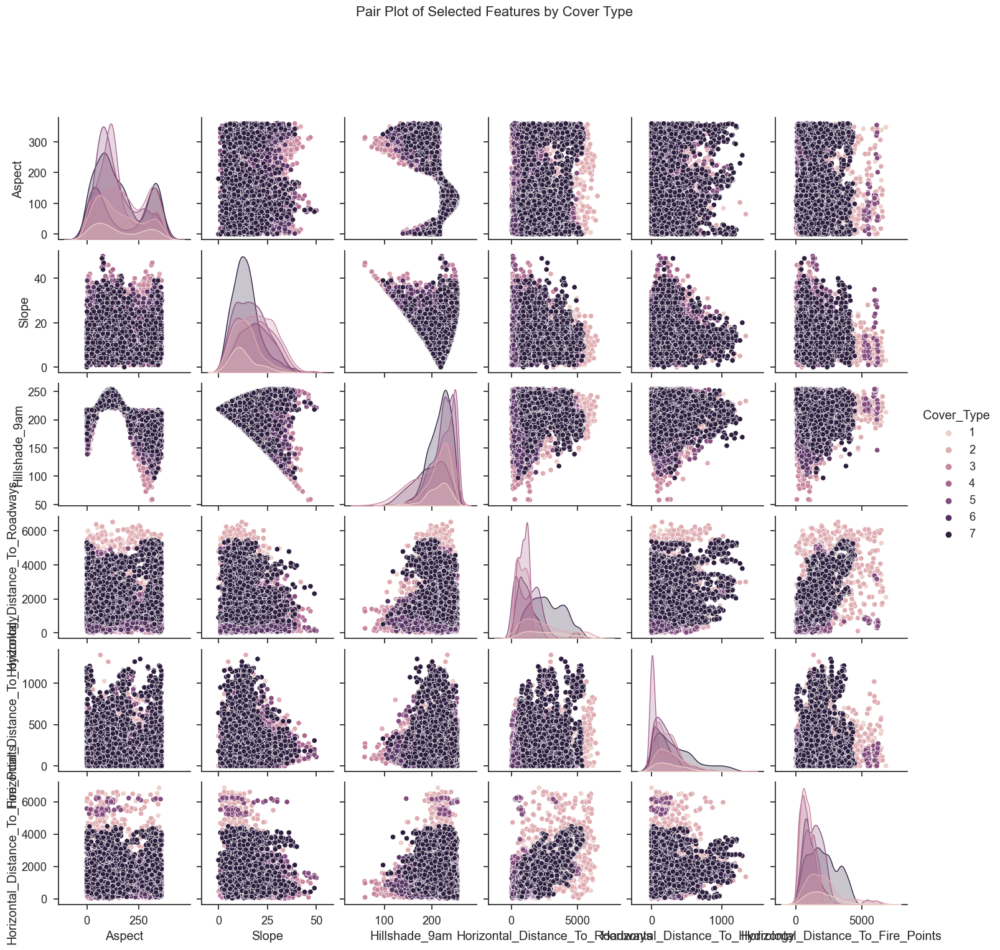

In [29]:
plot_pairplot(Forest_Train)

In [30]:
# plot_pairplot(Forest_Test)

In [31]:
# plot_pairplot(Forest_validation)

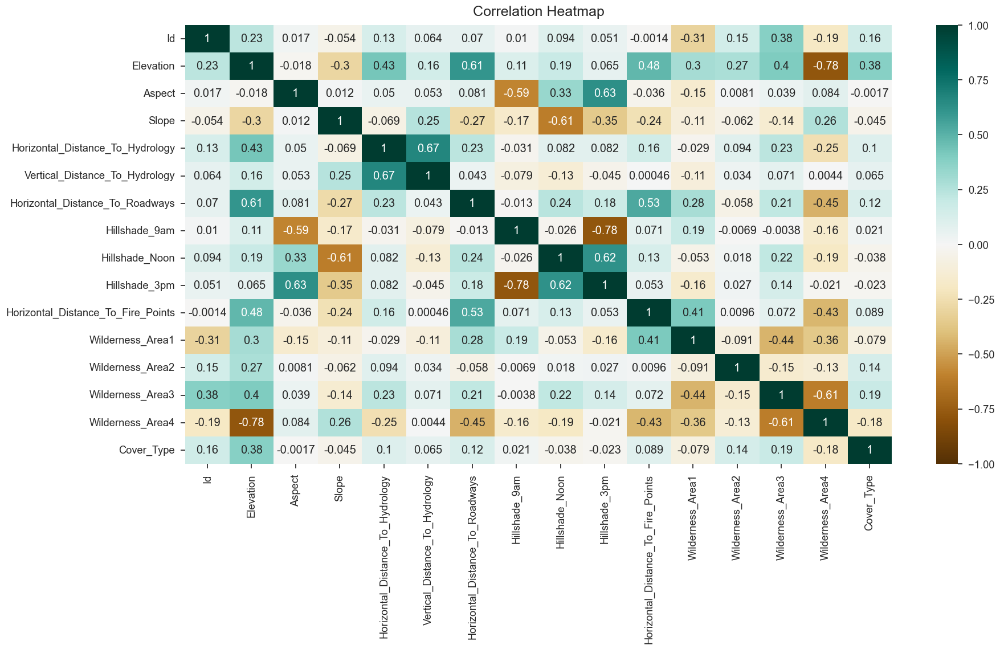

In [32]:
col_list = Forest_Train.columns
col_list = [col for col in col_list if not col[0:4]=='Soil']

plt.figure(figsize=(20, 10))

heatmap = sns.heatmap(Forest_Train[col_list].corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);

# plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')

In [33]:
def Perform_TSNE(X_Data_pca,Lable,Title=None):
    tsne = TSNE(n_components=2, random_state=0)
    X_train_tsne = tsne.fit_transform(X_Data_pca)
#     X_test_tsne = tsne.fit_transform(X_test_pca)

    
    plt.figure(figsize=(15, 10))
    plt.scatter(X_train_tsne[:, 0], X_train_tsne[:, 1], c=Lable, cmap="Reds")
    plt.title(f"t-SNE Visualization - {Title}")
    plt.colorbar()
    plt.show()

In [34]:
def Split_data(Forest_data):
    X = Forest_data.drop('Cover_Type', axis=1)
    y = Forest_data['Cover_Type']
    return X,y

In [35]:
X_train,y_train=Split_data(Forest_Train)

In [36]:
X_test,y_test=Split_data(Forest_Test)

In [37]:
X_validation,y_validation=Split_data(Forest_validation)

In [38]:
X_train= X_train.drop('Id', axis=1)

In [39]:
X_test= X_test.drop('Id', axis=1)

In [40]:
X_validation= X_validation.drop('Id', axis=1)

In [41]:
X_train

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
0,2976,85,23,95,72,2436,246,193,64,836,...,0,0,0,0,0,0,0,0,0,0
1,3104,233,12,150,40,1503,200,251,186,1129,...,0,0,0,0,0,0,0,0,0,0
2,3385,160,7,937,204,1224,228,242,147,752,...,1,0,0,0,0,0,0,0,0,0
3,3191,41,14,210,37,3207,221,208,119,865,...,0,1,0,0,0,0,0,0,0,0
4,2821,297,4,85,1,992,208,238,169,242,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8281,3294,328,13,624,192,3506,188,224,175,3583,...,0,0,0,0,0,0,0,0,0,1
8282,3390,24,6,216,13,3332,217,226,146,2226,...,0,0,0,0,0,0,1,0,0,0
8283,3350,100,18,175,-26,2121,247,212,88,3322,...,0,0,0,0,0,0,0,1,0,0
8284,3727,5,17,984,318,4934,195,204,143,3092,...,0,0,0,0,0,0,0,0,0,1


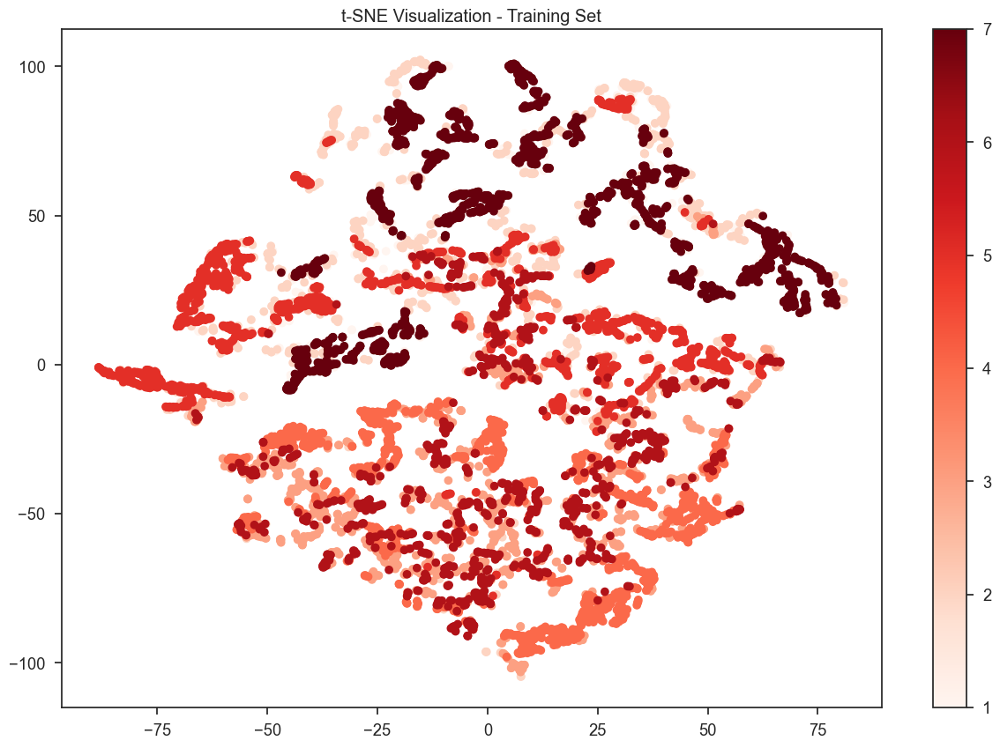

In [42]:
Perform_TSNE(X_train,y_train,"Training Set")

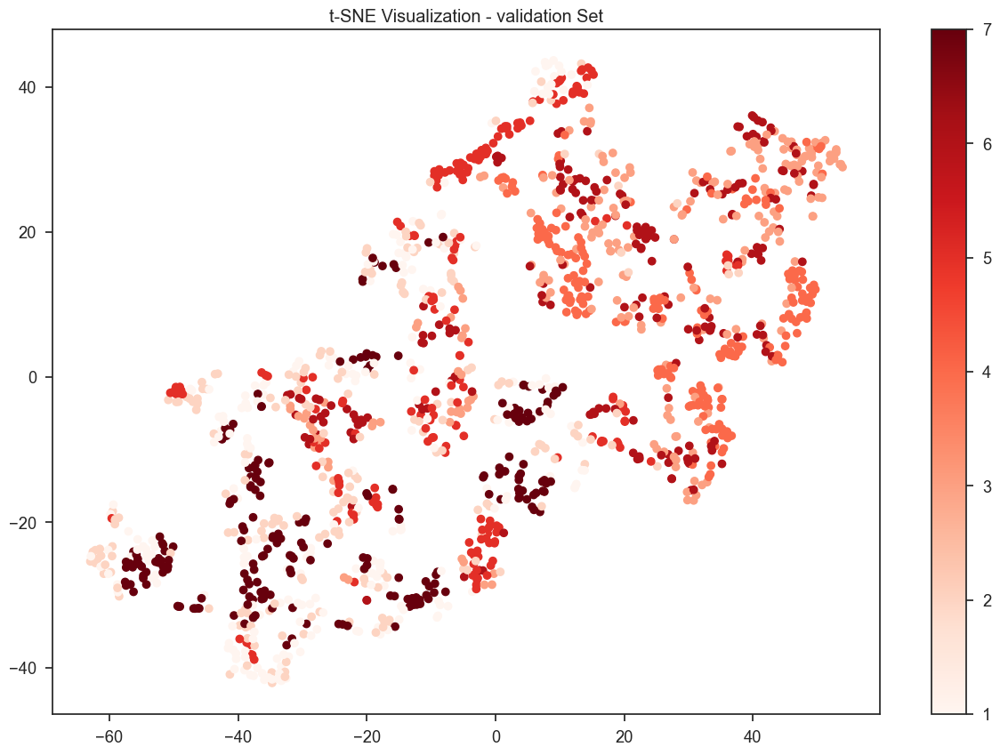

In [43]:
Perform_TSNE(X_validation,y_validation,"validation Set")

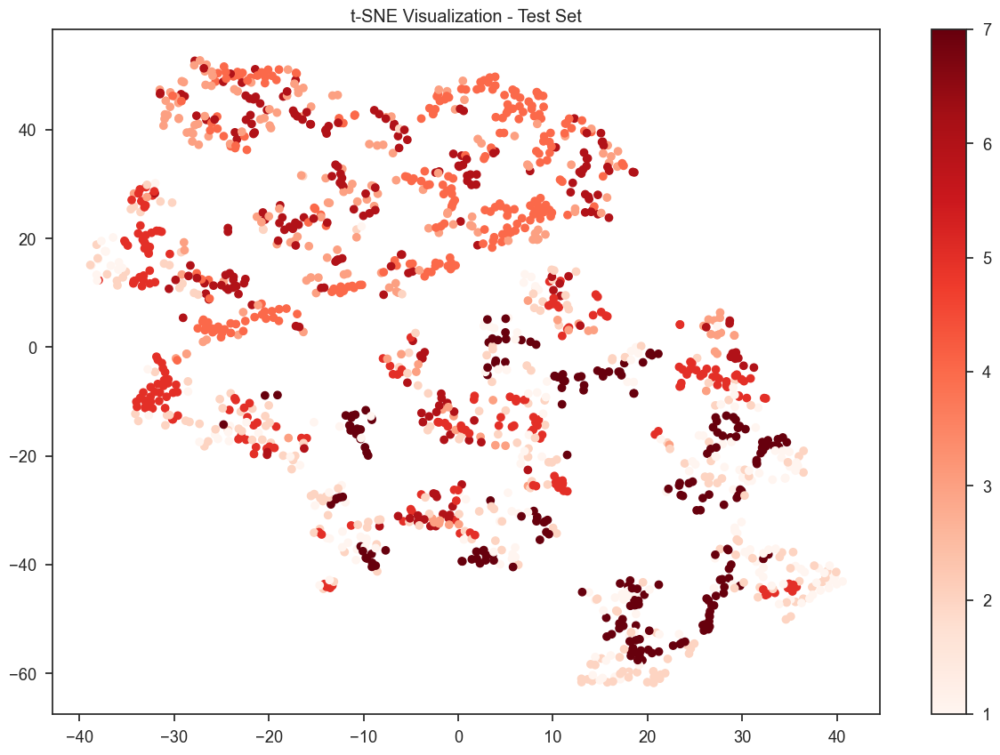

In [44]:
Perform_TSNE(X_test,y_test,"Test Set")

# data Preprocessing

In [45]:
# Create a scaler and scale the data
def data_scaler(Data):
    selected_columns_numeric= ['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
                                 'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
                                 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
                                 'Horizontal_Distance_To_Fire_Points']

    
#     scaler = MinMaxScaler() 
    scaler = StandardScaler() 

    Data[selected_columns_numeric]  = scaler.fit_transform(Data[selected_columns_numeric])
#     x_test_scaled = scaler.transform(X_test)
#     Data_scaled_df = pd.DataFrame(Data_scaled, columns=Data.columns)
    return Data


In [46]:
def Naive_Bayes_Models(classifier,X__train,Y__train,X__test):
    classifier.fit(X__train, Y__train)
    classifier_predictions = classifier.predict(X__test)
    return classifier_predictions

In [47]:
def knn_model(x_train, y_train, X_test, k):
    knn = KNeighborsClassifier(n_neighbors=k, metric="euclidean")
    knn.fit(x_train, y_train)

    y_test_pred = knn.predict(X_test)
    return y_test_pred

In [48]:
def DecisionTree_model(x_train, y_train, X_test, max_depth):
#     dt = DecisionTreeClassifier(criterion='entropy', max_depth=max_depth,max_leaf_nodes=int((2**max_depth)*0.5 +1), 
#                                  random_state=42)
    dt = DecisionTreeClassifier()
    dt.fit(x_train, y_train)

    y_pred_entropy = dt.predict(X_test)
    return y_pred_entropy

In [49]:
def svm_model(x_train, y_train, X_test):
    svm = SVC(kernel='rbf')
    svm.fit(x_train, y_train)

    y_pred_svm = svm.predict(X_test)
    return y_pred_svm

In [50]:
def LogisticRegressio_model(x_train, y_train, X_test):
    
    logreg = LogisticRegression(solver='liblinear')


    logreg.fit(x_train, y_train)

    y_pred_logreg = logreg.predict(X_test)
    return y_pred_logreg

In [51]:
x_train_scaled=data_scaler(X_train)
X_test_scaled=data_scaler(X_test)
X_validation_scaled=data_scaler(X_validation)

In [52]:
validation_accuracy  = {}
Test_accuracy  = {}

In [53]:
y_validation_pred_knn = knn_model(x_train_scaled, y_train, X_validation_scaled, k=5)

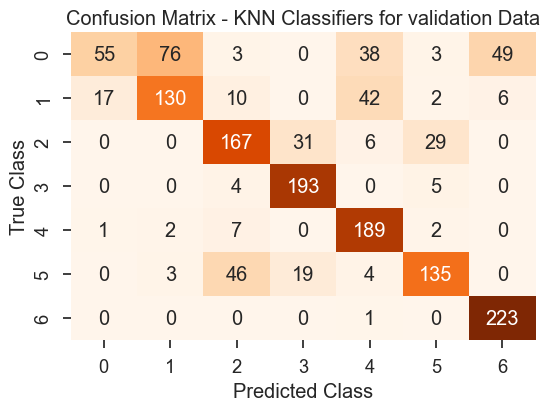

Accuracy:  0.7289719626168224


In [54]:
knn_baseline_validation=conf_matrix(y_validation,y_validation_pred_knn,"KNN Classifiers for validation")

In [55]:
y_test_pred_knn = knn_model(x_train_scaled, y_train, X_test_scaled, k=5)

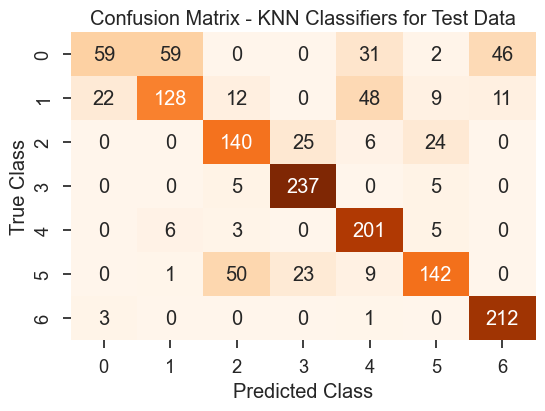

Accuracy:  0.7337704918032787


In [56]:
knn_baseline_Test=conf_matrix(y_test,y_test_pred_knn,"KNN Classifiers for Test")

In [57]:
validation_accuracy ['KNN'] = knn_baseline_validation
Test_accuracy  ['KNN']= knn_baseline_Test

In [58]:
Gaussian_validation_predictions=Naive_Bayes_Models(GaussianNB(),x_train_scaled,y_train,X_validation_scaled)

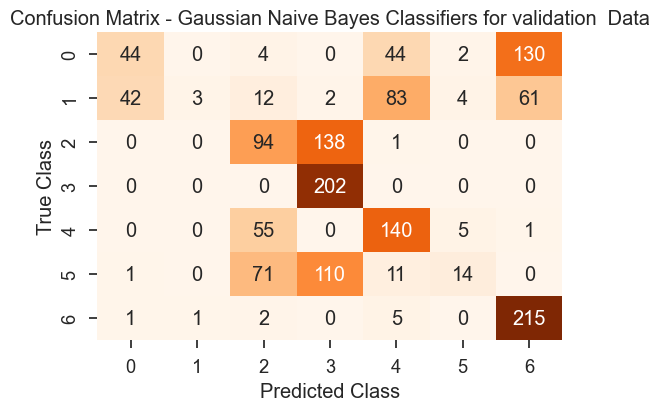

Accuracy:  0.4753004005340454


In [59]:
nb_baseline_validation= conf_matrix(y_validation,Gaussian_validation_predictions,"Gaussian Naive Bayes Classifiers for validation ")

In [60]:
Gaussian_test_predictions=Naive_Bayes_Models(GaussianNB(),x_train_scaled,y_train,X_test_scaled)

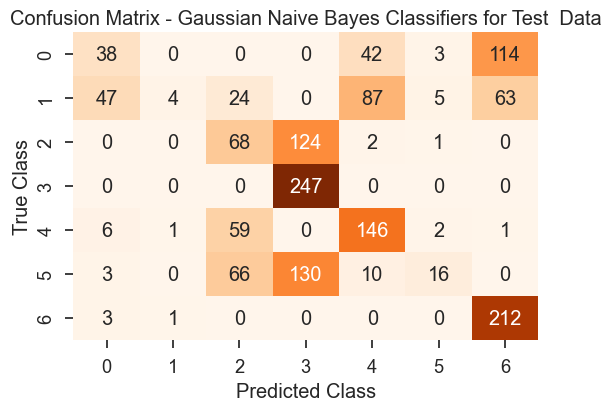

Accuracy:  0.479344262295082


In [61]:
nb_baseline_Test= conf_matrix(y_test,Gaussian_test_predictions,"Gaussian Naive Bayes Classifiers for Test ")

In [62]:
validation_accuracy ['Gaussian Naive'] = nb_baseline_validation
Test_accuracy  ['Gaussian Naive']= nb_baseline_Test

In [63]:
y_validation_pred_DT = DecisionTree_model(x_train_scaled, y_train, X_validation_scaled, 7)

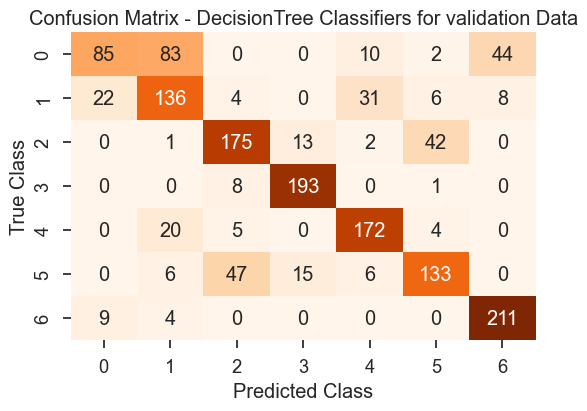

Accuracy:  0.7376502002670227


In [64]:
DT_baseline_validation= conf_matrix(y_validation,y_validation_pred_DT,"DecisionTree Classifiers for validation")

In [65]:
y_test_pred_DT = DecisionTree_model(x_train_scaled, y_train, X_test_scaled, 7)

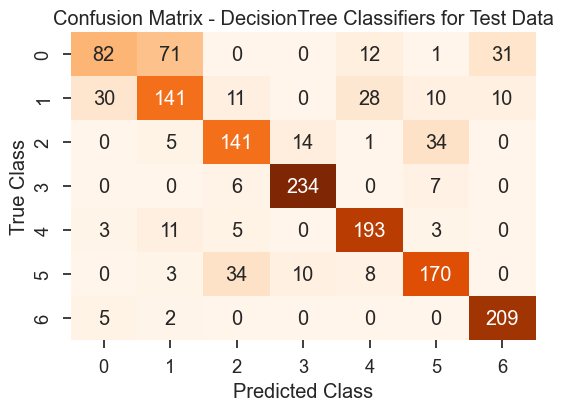

Accuracy:  0.7672131147540984


In [66]:
DT_baseline_Test= conf_matrix(y_test,y_test_pred_DT,"DecisionTree Classifiers for Test")

In [67]:
validation_accuracy ['DecisionTree'] = DT_baseline_validation
Test_accuracy  ['DecisionTree']= DT_baseline_Test

In [68]:
y_validation_pred_SVM = svm_model(x_train_scaled, y_train, X_validation_scaled)

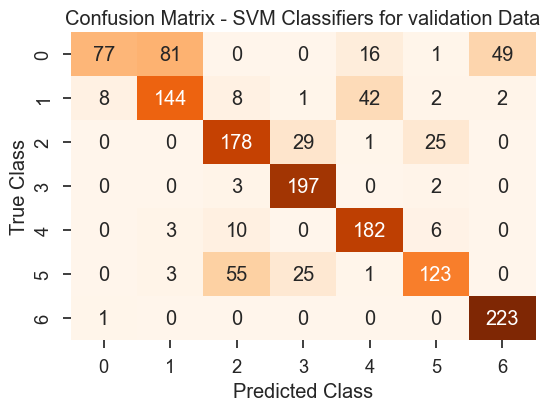

Accuracy:  0.7503337783711616


In [69]:
SVM_baseline_validation= conf_matrix(y_validation,y_validation_pred_SVM,"SVM Classifiers for validation")

In [70]:
y_test_pred_SVM = svm_model(x_train_scaled, y_train, X_test_scaled)

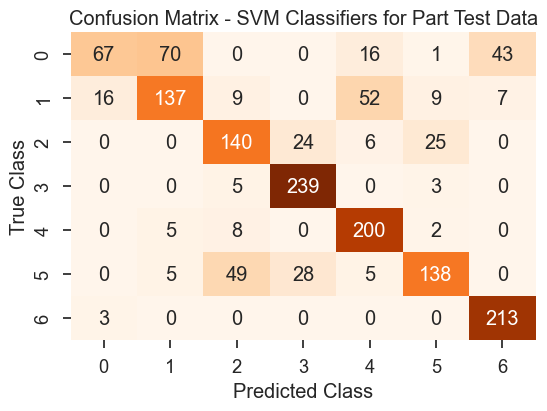

Accuracy:  0.7436065573770492


In [71]:
SVM_baseline_Test= conf_matrix(y_test,y_test_pred_SVM,"SVM Classifiers for Part Test")

In [72]:
validation_accuracy ['SVM'] = SVM_baseline_validation
Test_accuracy  ['SVM']= SVM_baseline_Test

In [73]:
y_validation_pred_logreg = LogisticRegressio_model(x_train_scaled, y_train, X_validation_scaled)

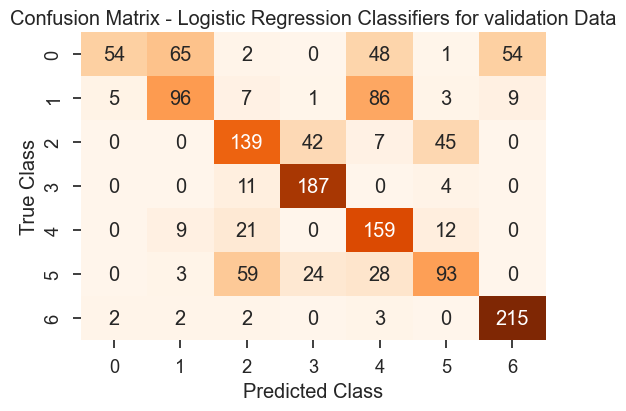

Accuracy:  0.6295060080106809


In [74]:
logreg_baseline_validation= conf_matrix(y_validation,y_validation_pred_logreg,"Logistic Regression Classifiers for validation")

In [75]:
y_test_pred_logreg = LogisticRegressio_model(x_train_scaled, y_train, X_test_scaled)

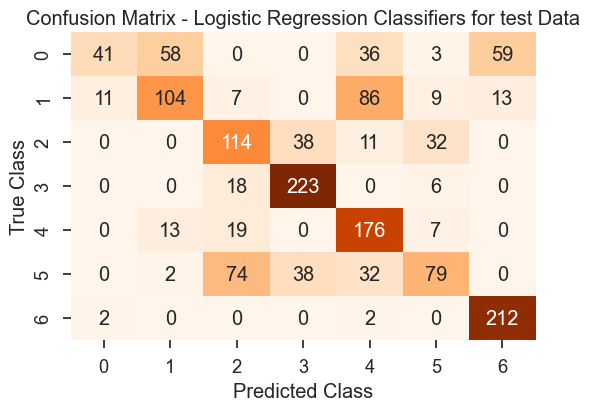

Accuracy:  0.6222950819672131


In [76]:
logreg_baseline_test= conf_matrix(y_test,y_test_pred_logreg,"Logistic Regression Classifiers for test")

In [77]:
validation_accuracy ['Logistic Regression'] = logreg_baseline_validation
Test_accuracy  ['Logistic Regression']= logreg_baseline_test

In [78]:
def plot_bar_chart_baseline(accuracy_dict,title=None):
    best_model_name = max(accuracy_dict, key=accuracy_dict.get)
    best_model_accuracy = accuracy_dict[best_model_name]

    plt.figure(figsize=(10, 6))
    # Plot the accuracy scores in a bar chart
    bars=plt.bar(accuracy_dict.keys(), accuracy_dict.values(),color='cyan')
    plt.ylim(0, 1)
    plt.xlabel("Models")
    plt.ylabel("Accuracy")
    plt.title(f"Baseline Performance - Accuracy for each ML method for {title}")

    # Add a horizontal line at the highest accuracy
    plt.axhline(y=best_model_accuracy, color='red', linestyle='--', 
                label=f'Highest Accuracy - {best_model_name}: {best_model_accuracy:.2f}')
    plt.legend()

    # Adding accuracy value above each bar
    for bar, accuracy in zip(bars, accuracy_dict.values()):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f"{accuracy:.2f} %", 
                 ha='center', va='bottom', fontsize=12)
    plt.show()

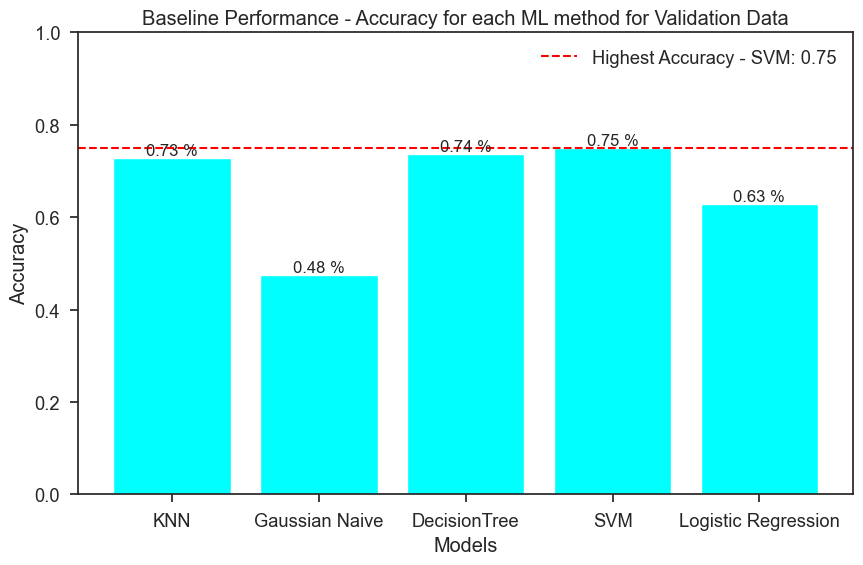

In [79]:
plot_bar_chart_baseline(validation_accuracy,"Validation Data")

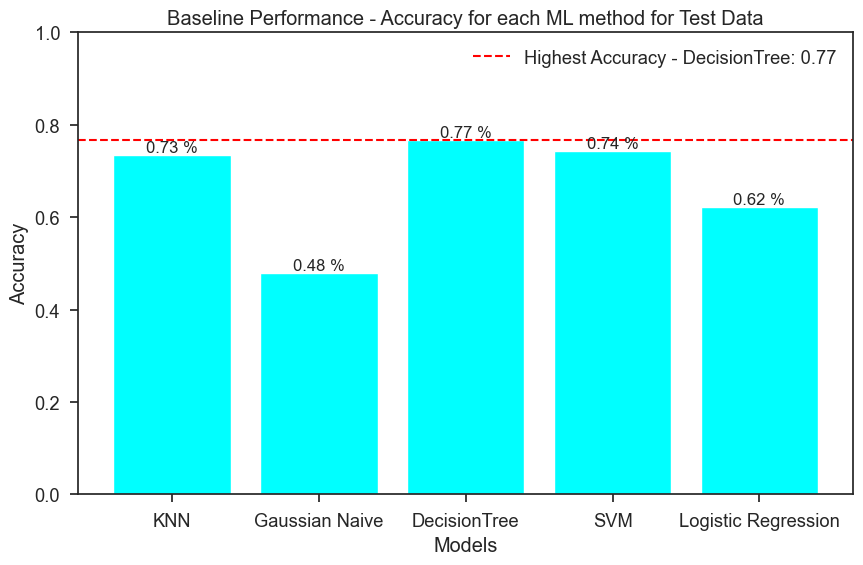

In [80]:
plot_bar_chart_baseline(Test_accuracy,"Test Data")

# Q2

In [81]:
def dimensionality_reduction_PCA (x_train_scaled,X_test_scaled,X_validation_scaled):
    pca = PCA(n_components=2, random_state=0)
    X_train_pca = pca.fit_transform(x_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)
    X_validation_pca = pca.transform(X_validation_scaled)
    return X_train_pca,X_test_pca,X_validation_pca

In [82]:
# X_train_pca,X_test_pca,X_validation_pca=dimensionality_reduction_PCA(x_train_scaled,X_test_scaled,X_validation_scaled)

In [83]:
X_train_pca,X_test_pca,X_validation_pca=dimensionality_reduction_PCA(X_train,X_test,X_validation)

In [84]:
y_validation_pred_DT = DecisionTree_model(X_train_pca, y_train, X_validation_pca, 7)

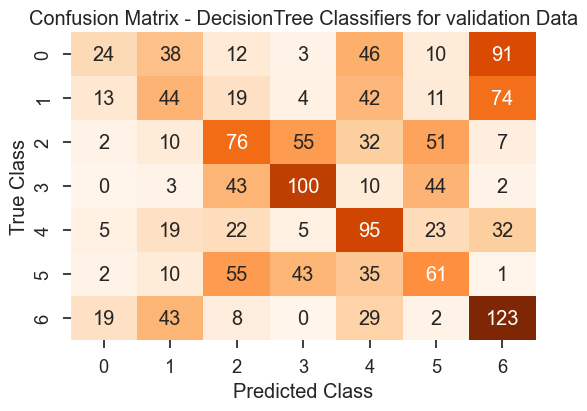

Accuracy:  0.34913217623498


In [85]:
DT_PCA_validation= conf_matrix(y_validation,y_validation_pred_DT,"DecisionTree Classifiers for validation")

In [86]:
y_test_pred_DT = DecisionTree_model(X_train_pca, y_train, X_test_pca, 7)

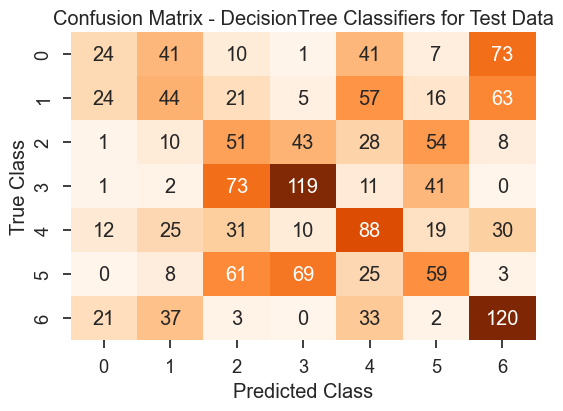

Accuracy:  0.33114754098360655


In [87]:
DT_PCA_Test= conf_matrix(y_test,y_test_pred_DT,"DecisionTree Classifiers for Test")

In [88]:
y_validation_pred_SVM = svm_model(X_train_pca, y_train, X_validation_pca)

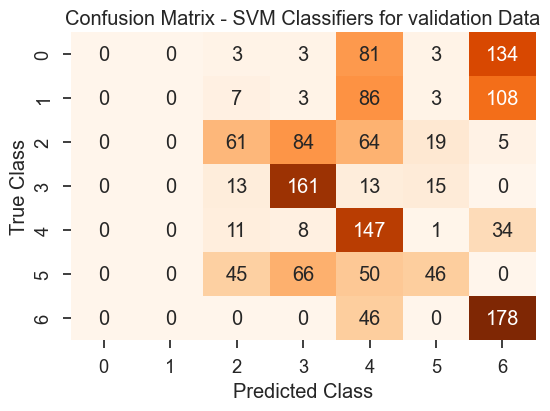

Accuracy:  0.39586114819759677


In [89]:
SVM_PCA_validation= conf_matrix(y_validation,y_validation_pred_SVM,"SVM Classifiers for validation")

In [90]:
y_test_pred_SVM = svm_model(X_train_pca, y_train, X_test_pca)

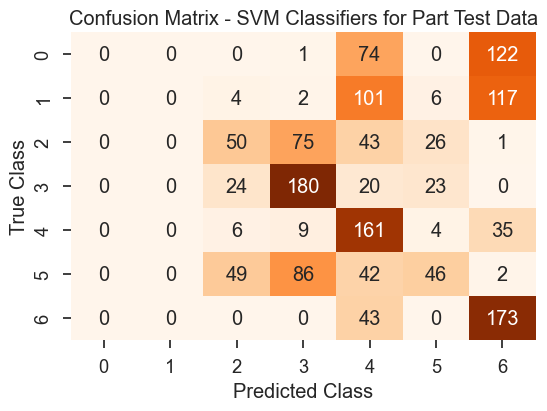

Accuracy:  0.4


In [91]:
SVM_PCA_Test= conf_matrix(y_test,y_test_pred_SVM,"SVM Classifiers for Part Test")

# Feature selection

In [92]:
def select_feature(X_train, y_train, X_test,X_validation , FSM):
    fs = FSM
    fs.fit(X_train, y_train)
    X_train_new = fs.transform(X_train)
    X_test_new = fs.transform(X_test)
    X_validation_new = fs.transform(X_validation)
    
   

    return X_train_new,X_test_new,X_validation_new

In [93]:
def apply_wrapper_RFECV_methods(X, y, estimator, k):
    # Recursive Feature Elimination with Cross-Validation
    rfecv = RFECV(estimator=estimator, step=1, cv=5)
    X_rfecv = rfecv.fit_transform(X, y)

    return X_rfecv

In [94]:
def apply_wrapper_feature_elimination_methods(X, y, estimator, k, forward=True):
    # Sequential Feature Selector
    sfs = SequentialFeatureSelector(estimator, n_features_to_select=k, direction='forward' if forward else 'backward')
    X_selected = sfs.fit_transform(X, y)

    return X_selected

In [95]:
acc_dict_DT_validation = {}
acc_dict__DT_Test = {}

acc_dict_SVM_validation = {}
acc_dict_SVM_Test = {}

In [96]:
# num_features = len(X_train.columns)
# num_features

In [ ]:
for k in range(1, len(X_train.columns) + 1):

    # Filter method: Information Gain
    fsm = SelectKBest(score_func=mutual_info_classif, k=k)
    # Variance Threshold
    var_threshold = VarianceThreshold(threshold=0.01)
    # X_var_threshold = var_threshold.fit_transform(X)


    X_train_new_SBest,X_test_new_SBest,X_validation_new_SBest = select_feature(X_train, y_train, X_test,X_validation, fsm)
#     X_train_new_Var,X_test_new_Var,X_validation_new_Var = select_feature(X_train, y_train, X_test,X_validation, var_threshold)
    
    
    
    y_validation_pred_DT = DecisionTree_model(X_train_new_SBest, y_train, X_validation_new_SBest, 7)
    acc_dict_DT_validation[k]=calculate_Accuracy(y_validation,y_validation_pred_DT)
#     print("DecisionTree Classifiers for validation (Information Gain)",calculate_Accuracy(y_validation,y_validation_pred_DT))
    

    y_test_pred_DT = DecisionTree_model(X_train_new_SBest, y_train, X_test_new_SBest, 7)
    acc_dict__DT_Test[k]=calculate_Accuracy(y_test,y_test_pred_DT)
#     print("DecisionTree Classifiers for Test (Information Gain)",calculate_Accuracy(y_test,y_test_pred_DT))
    

    
    y_validation_pred_SVM = svm_model(X_train_new_SBest, y_train, X_validation_new_SBest)
    acc_dict_SVM_validation[k]=calculate_Accuracy(y_validation,y_validation_pred_SVM)
#     print("SVM Classifiers for validation (Information Gain)",calculate_Accuracy(y_validation,y_validation_pred_SVM))
    

    
    y_test_pred_SVM = svm_model(X_train_new_SBest, y_train, X_test_new_SBest)
    acc_dict_SVM_Test[k]=calculate_Accuracy(y_test,y_test_pred_SVM)
    
#     print("SVM Classifiers for Part Test (Information Gain)",calculate_Accuracy(y_test,y_test_pred_SVM))
    
    
    
    print("-------------------------------------------------------------------------------------------------")

    
#     #############    X_var_threshold  
    
    
    
#     y_validation_pred_DT = DecisionTree_model(X_train_new_Var, y_train, X_validation_new_Var, 7)
#     DT_baseline_validation= conf_matrix(y_validation,y_validation_pred_DT,"DecisionTree Classifiers for validation (Variance Threshold)")

#     y_test_pred_DT = DecisionTree_model(X_train_new_Var, y_train, X_test_new_Var, 7)
#     DT_baseline_Test= conf_matrix(y_test,y_test_pred_DT,"DecisionTree Classifiers for Test (Variance Threshold)")
    
#     y_validation_pred_SVM = svm_model(X_train_new_Var, y_train, X_validation_new_Var)
#     SVM_baseline_validation= conf_matrix(y_validation,y_validation_pred_SVM,"SVM Classifiers for validation (Variance Threshold)")
    
#     y_test_pred_SVM = svm_model(X_train_new_Var, y_train, X_test_new_Var)
#     SVM_baseline_Test= conf_matrix(y_test,y_test_pred_SVM,"SVM Classifiers for Part Test (Variance Threshold)")
    
    
    

-------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------


In [ ]:
def Draw_plots(acc_list,baseline_accuracy, Title=None):
    fig = plt.figure()  # Create a new figure
    plt.plot(*zip(*sorted(acc_list.items())))
    plt.axhline(y=baseline_accuracy, color='r', linestyle='--', label='Baseline')
    # Title = "Feature Selection with Information Gain Method"
    plt.title(Title, fontsize=16)
    plt.xlabel("Number of Features", fontsize=16)
    plt.ylabel("Accuracy", fontsize=16)
    plt.show()
    print("Maximum accuracy:", max(acc_list.values()))
    print("Best number of features:", max(acc_list, key=acc_list.get))
    plt.show()
    # plt.close(fig)

In [ ]:
Draw_plots(acc_dict_DT_validation,DT_baseline_validation,"Feature Selection with Information Gain Method With DecisionTree for validation")


In [ ]:
Draw_plots(acc_dict__DT_Test,DT_baseline_Test,"Feature Selection with Information Gain Method With DecisionTree for Test")

In [ ]:
Draw_plots(acc_dict_SVM_validation,SVM_baseline_validation,"Feature Selection with Information Gain  Method With SVM for validation")


In [ ]:
Draw_plots(acc_dict_SVM_Test,SVM_baseline_Test,"Feature Selection with Information Gain  Method With SVM for Test")

In [ ]:
plt.figure(figsize=(16, 8))

plt.plot(*zip(*sorted(acc_dict_DT_validation.items())), marker='o', label='Feature Selection With DecisionTree (Val)')
plt.plot(*zip(*sorted(acc_dict__DT_Test.items())), marker='o', label='Feature Selection With DecisionTree (Test)')
plt.plot(*zip(*sorted(acc_dict_SVM_validation.items())), marker='o', label='Feature Selection With SVM (Val)')
plt.plot(*zip(*sorted(acc_dict_SVM_Test.items())), marker='o', label='Feature Selection With SVM (Test)')

# plt.plot(num_features, list(acc_dict_INFOGAin_KNN.values())[:9], marker='*', label='KNN with Information Gain ')
# plt.plot(num_features, list(acc_dict_INFOGAin_NB.values())[:9], marker='*', label='GaussianNB with Information Gain')
# plt.plot(num_features, list(acc_dict_VAR_NB.values())[:9], marker='*', label='GaussianNB with Variance Threshold')
# plt.plot(num_features, list(acc_dict_VAR_KNN.values())[:9], marker='*', label='KNN  with Variance Threshold')

plt.xlabel('Number of Features')
plt.ylabel('Accuracy')
plt.title('Comparison of Feature Selection Methods')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
g

In [ ]:
# # num_features = np.arange(1, 10)
# def forward_backward_feature(estimator,X_train, y_train,X_validation ,X_test,dr ="forward"):

#     accuracies = []

#     for k in range(1, len(X_train.columns) + 1):
#         # Sequential Feature Selector
#         sfs = SequentialFeatureSelector(estimator, n_features_to_select=k,direction=dr)
#         sfs.fit(X_train, y_train)
#         X_train_selected =sfs.transform(X_train)
#         X_test_selected =sfs.transform(X_test)
#         X_validation_selected =sfs.transform(X_validation)
        
# #         # Train a model using the selected features
# #         estimator.fit(X_selected, y_train)
# #         X_test_selected = sfs.transform(X_test)
# #         predictions = estimator.predict(X_test_selected)

# #         # Calculate the accuracy
# #         accuracy = f1_score(y_test, predictions)
# #         accuracies.append(accuracy)

#     return X_train_selected,X_test_selected,X_validation_selected

In [ ]:
num_features = np.arange(1, 54)
def forward_backward_feature(estimator, X_train, y_train, X_test,X_validation,y_validation, y_test,dr ="forward"):

    accuracies = []
    accuracies_validation = []
    

    for k in num_features:
        # Sequential Feature Selector
        sfs = SequentialFeatureSelector(estimator, n_features_to_select=k,direction=dr)
        sfs.fit_transform(X_train, y_train)
        X_train_selected =sfs.transform(X_train)
        X_test_selected =sfs.transform(X_test)
        X_validation_selected =sfs.transform(X_validation)
        
        # Train a model using the selected features
        estimator.fit(X_train_selected, y_train)
#         X_test_selected = sfs.transform(X_test)
        predictions_test = estimator.predict(X_test_selected)
        predictions_validation = estimator.predict(X_validation_selected)
        
        # Calculate the accuracy
        accuracy_test = accuracy_score(y_test, predictions_test)
        accuracy_validation = accuracy_score(y_validation, predictions_validation)
        
        accuracies.append(accuracy_test)
        accuracies_validation.append(accuracy_validation)

    return accuracies,accuracies_validation

In [ ]:
dt = DecisionTreeClassifier()
svm = SVC(kernel='rbf')

In [ ]:
accuracies,accuracies_validation=forward_backward_feature(DecisionTreeClassifier(), X_train, y_train, X_test,X_validation,y_validation, y_test)

In [ ]:

print(f'max score Test {max(accuracies)}')
print(f'max score validation {max(accuracies_validation)}')

In [ ]:
def plot_num_features_vs_accuracy(accuracies, baseline_accuracy,name_estimator ):
    plt.plot(num_features, accuracies, marker='o')
    plt.axhline(y=baseline_accuracy, color='r', linestyle='--', label='Baseline')
    plt.xlabel('Number of Features')
    plt.ylabel("F1 Score")
    plt.title(f'{name_estimator}')
    plt.legend()
    plt.show()

In [ ]:
plot_num_features_vs_accuracy(accuracies_validation,DT_baseline_validation,"Forward Feature Elimination With KNN")

In [ ]:
plot_num_features_vs_accuracy(accuracies,DT_baseline_Test,"Forward Feature Elimination With KNN")